In [1]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from itables import init_notebook_mode, show
import numpy as np
import scipy.stats as stats
from netgraph import Graph, InteractiveGraph
from pyvis.network import Network
import plotly.express as px


## Production des données

Relationships with birth date


```sparql

PREFIX dbr: <http://dbpedia.org/resource/>
PREFIX dbp: <http://dbpedia.org/property/>
PREFIX dbo: <http://dbpedia.org/ontology/>
PREFIX rdfs:<http://www.w3.org/2000/01/rdf-schema#>
SELECT DISTINCT (?o1 AS ?subject_uri) ?subjectBirthDate ?typeRelationship (?target AS ?object_uri) ?objectBirthDate
# (COUNT(*) AS ?effectif) 
WHERE {
  SELECT DISTINCT ?o1 ?subjectBirthDate ?typeRelationship  ?target  ?objectBirthDate 
  WHERE { 
    {
          {dbr:List_of_astronomers ?p ?o1.}
      UNION
          {dbr:List_of_astrologers ?p ?o1.}
      UNION
          {?o1 ?p dbr:Astrologer.}
      UNION
          {?o1 ?p dbr:Astronomer.}
      UNION
          {?o1 ?p dbr:Mathematician.}
    }
    ?o1 a dbo:Person;
      dbp:birthDate | dbo:birthDate ?subjectBirthDate.
     {
        {?o1 dbo:influenced ?target.
     BIND('influenced' AS ?typeRelationship) }
UNION  {?o1 dbo:influencedBy ?target.
     BIND('influencedBy' AS ?typeRelationship) }
# UNION  {?o1 dbp:influences ?target.
#     BIND('influences' AS ?typeRelationship) }
UNION  {?o1 dbp:successor ?target.
     BIND('successor' AS ?typeRelationship) }
UNION  {?o1 dbp:predecessor ?target.
     BIND('predecessor' AS ?typeRelationship) }
UNION  {?o1 dbo:doctoralAdvisor ?target.
     BIND('doctoralAdvisor' AS ?typeRelationship) }
UNION  {?o1 dbo:academicAdvisor ?target.
     BIND('academicAdvisor' AS ?typeRelationship) }
 }
?target a dbo:Person;
   dbp:birthDate | dbo:birthDate ?objectBirthDate .

    BIND(xsd:integer(SUBSTR(STR(?subjectBirthDate), 1, 4)) AS ?birthYear)
    FILTER ( (?birthYear >= 1451   && ?birthYear < 1771 ))
 
          }
  ORDER BY ?birthYear
  }


```



In [2]:
# f = 'data/dbpedia_sparql_influences.csv'
fd = 'data/dbpedia_sparql_influences_birth_date.csv'
df = pd.read_csv(fd); len(df); df.head(2)

,subject_uri,subjectBirthDate,typeRelationship,object_uri,objectBirthDate
0,http://dbpedia.org/resource/Domenico_Maria_Nov...,1454-08-01,academicAdvisor,http://dbpedia.org/resource/Regiomontanus,1436-06-06
1,http://dbpedia.org/resource/Domenico_Maria_Nov...,1454-08-01,academicAdvisor,http://dbpedia.org/resource/Luca_Pacioli,1447


In [3]:
## Explorer les données importées
# Configuration:  https://github.com/mwouts/itables/blob/main/docs/advanced_parameters.md
show(df.sort_values(by='subjectBirthDate'), classes="display", scrollY="200px", scrollCollapse=True, paging=False, column_filters="footer", dom="lrtip")

In [4]:
### Compter les relations présentes
df.groupby(by='typeRelationship').size()

typeRelationship
academicAdvisor     51
doctoralAdvisor     11
influenced         146
influencedBy       110
predecessor          8
successor           10
dtype: int64

### Coder et transformer les relations

* on observant les données, on remarque que les directions des relations pas les mêmes même si la relation est sémantiquement équivalente
   * par exemple: les relations 'successor' et 'predecessor' ont le même sens mais une direction inverse
   * il est donc indispensable en vue de l'analyse de transformer les données pour homogénéiser la sémantique des relations
* dans la fonction suivante on traite les différents cas de figure et on proposer à la sortie des relations cohérentes dans lesquelles à parité de sémantique la direction source -> target est toujours la même:
   * par exemple les relations 'predecessor' sont traitées comme des relations 'successor' en inversant les sommets



In [5]:
def code_relationship(ligne):
    if ligne['typeRelationship'] == 'predecessor':
        ligne['source'] = ligne['object_uri'].replace('http://dbpedia.org/resource/', '')
        ligne['relationship'] = 'successor'
        ligne['target'] = ligne['subject_uri'].replace('http://dbpedia.org/resource/', '')
    elif ligne['typeRelationship'] == 'influencedBy':
        ligne['source'] = ligne['object_uri'].replace('http://dbpedia.org/resource/', '')
        ligne['relationship'] = 'influenced'
        ligne['target'] = ligne['subject_uri'].replace('http://dbpedia.org/resource/', '')
    elif ligne['typeRelationship'] == 'academicAdvisor':
        ligne['source'] = ligne['object_uri'].replace('http://dbpedia.org/resource/', '')
        ligne['relationship'] = 'academicAdvisorOf'
        ligne['target'] = ligne['subject_uri'].replace('http://dbpedia.org/resource/', '')
    elif ligne['typeRelationship'] == 'doctoralAdvisor':
        ligne['source'] = ligne['object_uri'].replace('http://dbpedia.org/resource/', '')
        ligne['relationship'] = 'academicAdvisorOf'
        ligne['target'] = ligne['subject_uri'].replace('http://dbpedia.org/resource/', '')
    else:
        ligne['source'] = ligne['subject_uri'].replace('http://dbpedia.org/resource/', '')
        ligne['relationship'] = ligne['typeRelationship']
        ligne['target'] = ligne['object_uri'].replace('http://dbpedia.org/resource/', '')        

In [6]:
### La fonction est appliquée à la table en ajoutant de nouvelles colonnes
df['source']= ''
df['relationship']= ''
df['target']= ''
df.apply(code_relationship, axis=1)
df[5:7]

,subject_uri,subjectBirthDate,typeRelationship,object_uri,objectBirthDate,source,relationship,target
5,http://dbpedia.org/resource/Nicolaus_Olahus,1493-01-10,successor,http://dbpedia.org/resource/Antun_Vrančić,1504-05-29,Nicolaus_Olahus,successor,Antun_Vrančić
6,http://dbpedia.org/resource/Nicolaus_Olahus,1493-01-10,predecessor,http://dbpedia.org/resource/George_Martinuzzi,1482,George_Martinuzzi,successor,Nicolaus_Olahus


In [7]:
### Explorer les données dans la nouvelle direction
# les nouvelles colonnes sont en première position 
show(df[['source', 'relationship', 'target', 'subject_uri', 'typeRelationship', 'object_uri', 'subjectBirthDate']].sort_values(by='subjectBirthDate'), classes="display", scrollY="300px", scrollCollapse=True, paging=False, column_filters="footer", dom="lrtip")

In [8]:
### Compter les types de relations
df.groupby(by='relationship').size()

relationship
academicAdvisorOf     62
influenced           256
successor             18
dtype: int64

#### Doublons

Y a-t-il des doublons ? Notamment produits par la transormation 

* Oui : 37
* Pour les éliminer on regroupe par triplets et on les compte
* On obtient ainsi des relations uniques avec indication de l'effectif par chacune dans le 'df'

In [9]:
### Regrouper et compter
sdf = df.groupby(by=['source','relationship','target']).size()

In [10]:
### Nombre de doublons
print(len(sdf.values[sdf.values > 1]))
sdf = pd.DataFrame(sdf)
sdf.columns=['effectif']
### Réindexer et inspecter
sdf = sdf.reset_index(); sdf.sort_values(by='effectif', ascending=False).head()

37


,source,relationship,target,effectif
81,Gerolamo_Cardano,influenced,Pierre_de_Fermat,3
152,Isaac_Newton,influenced,Émilie_du_Châtelet,3
130,Isaac_Newton,influenced,David_Gregory_(mathematician),3
58,François_Viète,influenced,Pierre_de_Fermat,3
236,Pierre_de_Fermat,influenced,Gilles_de_Roberval,2


In [11]:
### Compter les types de relations, maintenant sur les valeurs uniques
sdf.groupby(by='relationship').size()

relationship
academicAdvisorOf     59
influenced           218
successor             18
dtype: int64

In [12]:
### Compter les relations par personne, position source 
person_s = pd.DataFrame(sdf.groupby(by='source').size())
person_s.columns = ['effectif_out']
person_s.index.rename('person', inplace=True)
person_s.sort_values(by='effectif_out', ascending=False).head(10)

,effectif_out
person,
Gottfried_Wilhelm_Leibniz,29
Isaac_Newton,28
René_Descartes,22
Pierre_Gassendi,11
Gerolamo_Cardano,8
Blaise_Pascal,8
Aristotle,5
Leonhard_Euler,5
Samuel_von_Pufendorf,4


In [13]:
### Compter les relations, position cible
person_t = pd.DataFrame(sdf.groupby(by='target').size())
person_t.columns = ['effectif_in']
person_t.index.rename('person', inplace=True)
person_t.sort_values(by='effectif_in', ascending=False).head(10)

,effectif_in
person,
René_Descartes,19
Isaac_Newton,9
Gottfried_Wilhelm_Leibniz,8
Blaise_Pascal,6
Pierre_Louis_Maupertuis,5
Pierre_Gassendi,5
Nicolas_Fatio_de_Duillier,4
Johann_Heinrich_Lambert,4
Immanuel_Kant,4


In [14]:
### Joindre les deux tableaux
person = pd.merge(person_s, person_t, left_index=True,right_index=True)
print(f"Nombre de personnes: {len(person)} \n", person.sort_values(by='effectif_out', ascending=False).head(10))

Nombre de personnes: 55 
                                effectif_out  effectif_in
person                                                  
Gottfried_Wilhelm_Leibniz                29            8
Isaac_Newton                             28            9
René_Descartes                           22           19
Pierre_Gassendi                          11            5
Blaise_Pascal                             8            6
Leonhard_Euler                            5            3
David_Gregory_(mathematician)             4            2
Samuel_von_Pufendorf                      4            4
Pierre_Louis_Maupertuis                   4            5
Henry_Briggs_(mathematician)              4            1


In [15]:
def plot_densites (data_frame, rows, cols):
    ## https://engineeringfordatascience.com/posts/matplotlib_subplots/
    plt.figure(figsize=(18, 4))
    plt.subplots_adjust(wspace=0.5)
    plt.suptitle("Distributions et densités", fontsize=18, y=1)

    e=data_frame.columns

    # loop through the length of tickers and keep track of index
    for n, e in enumerate(e):
        
        #plt.figure(figsize=(10,4))
        # add a new subplot iteratively
        ax = plt.subplot(rows, cols, n + 1)

        # filter df and plot ticker on the new subplot axis
        vals = data_frame[e]
        plt.hist(vals, density=True)
        ax = vals.plot.kde()
        ax.set_xlim(min(vals),max(vals))

        ### Test de Shapiro-Wilk: hypothèse H0 = distribution normale    
        sa = round(stats.shapiro(vals).pvalue, 4)
        psa = (f"Test Shapiro-Wilk,pvalue: {sa}, on accepte l'H0: distribution normale" if sa > 0.049 \
               else f"pvalue: {sa},Test de Shapiro-Wilk on peut rejeter l'H0: distrib. non normale")

        plt.xlabel(psa, fontsize=10)

        ax.set_title(f'Variable: {e}', fontsize=12)


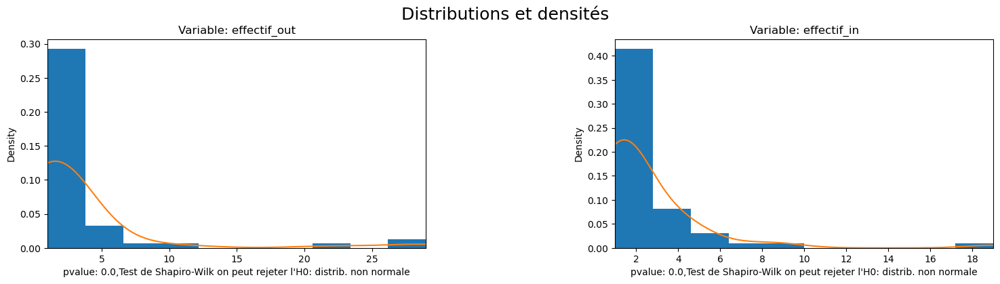

In [16]:
plot_densites(person, 1,2)

In [17]:
person.reset_index(inplace=True)
print(len(person), person.sort_values(by='effectif_out', ascending=False).head(7))

55                            person  effectif_out  effectif_in
17      Gottfried_Wilhelm_Leibniz            29            8
19                   Isaac_Newton            28            9
46                 René_Descartes            22           19
43                Pierre_Gassendi            11            5
2                   Blaise_Pascal             8            6
37                 Leonhard_Euler             5            3
6   David_Gregory_(mathematician)             4            2


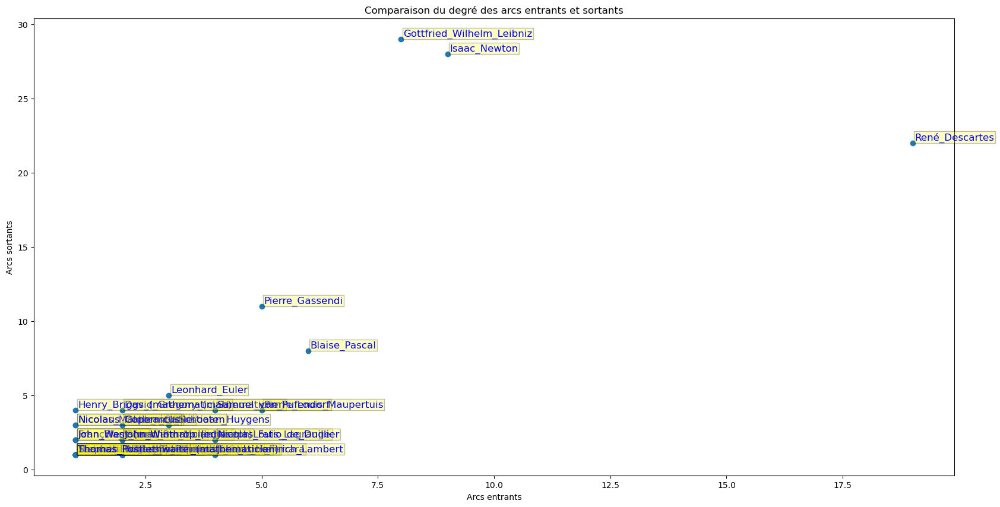

In [18]:

fig = plt.figure(figsize=(20,10))
x = person['effectif_in']
y = person['effectif_out']
l = person['person']
plt.plot(x, y, 'o')
plt.title("Comparaison du degré des arcs entrants et sortants")

"""for (xi, yi) in zip(x, y):
    plt.text(xi, yi, l, va='bottom', ha='center')"""
for i in range(person.shape[0]):
    plt.text(x=person.effectif_in[i]+0.05,y=person.effectif_out[i]+0.2,s=person['person'][i], 
          fontdict=dict(color='blue',size=12),
          bbox=dict(pad=1, facecolor='yellow',alpha=0.25))

plt.xlabel('Arcs entrants')
plt.ylabel('Arcs sortants')

# m = slope, b=intercept
#m, b = np.polyfit(x, y, 1)
#plt.plot(x, m*x + b)

plt.draw()

In [19]:
ppg = pd.DataFrame(person.groupby(by=['effectif_out', 'effectif_in'])['person'].agg(','.join))
ppg.columns=['persons']
ppg.reset_index(inplace=True)
ppg.head()

,effectif_out,effectif_in,persons
0,1,1,"Abraham_Gotthelf_Kästner,Benedetto_Castelli,Ch..."
1,1,2,"Domenico_Maria_Novara_da_Ferrara,George_Berkel..."
2,1,4,"David_Hume,Johann_Heinrich_Lambert,John_Locke"
3,2,1,"François_Viète,John_Flamsteed,John_West_(mathe..."
4,2,2,"Geminiano_Montanari,Johann_Bernoulli,John_Wint..."


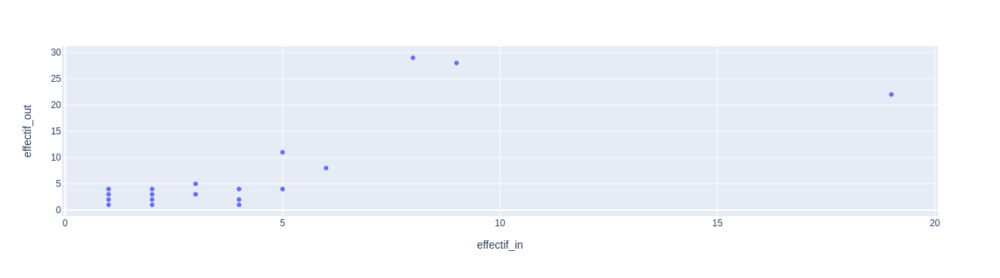

In [20]:
### Affichage interactif
pp = ppg

## Nuage de points avec droite de régression
# https://www.kite.com/python/answers/how-to-plot-a-linear-regression-line-on-a-scatter-plot-in-python

#fig = plt.figure(figsize=(20,20))
x = pp['effectif_in']
y = pp['effectif_out']
l = pp['persons']



fig = px.scatter(pp, x="effectif_in", y="effectif_out", hover_data=[l])

fig.show()


In [21]:
### https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.spearmanr.html
### Le coefficient de Spearman et la valeur de p 
# montrent qu'on peut rejeter l'H0 d'independance et qu'il y a 
# une correlation de rang entre être influencé et influencer
res = stats.spearmanr(person[['effectif_in', 'effectif_out']])
res.statistic, "{:.10f}".format(float(res.pvalue))


(0.5514387179293162, '0.0000128073')

### Créer un réseau

In [22]:
type(sdf), sdf.head()

(pandas.core.frame.DataFrame,
                       source       relationship  \
 0   Abraham_Gotthelf_Kästner  academicAdvisorOf   
 1      Adrien-Marie_Legendre         influenced   
 2  Anne_Conway_(philosopher)         influenced   
 3       Anselm_of_Canterbury         influenced   
 4                  Aristotle         influenced   
 
                             target  effectif  
 0  Johann_Christian_Martin_Bartels         1  
 1                  Évariste_Galois         1  
 2        Gottfried_Wilhelm_Leibniz         1  
 3                   René_Descartes         1  
 4        Gottfried_Wilhelm_Leibniz         1  )

In [23]:
###
# https://networkx.org/documentation/stable/reference/generated/networkx.convert_matrix.from_pandas_edgelist.html
G = nx.from_pandas_edgelist(sdf, source = "source", target = "target", edge_attr=["relationship"], create_using=nx.DiGraph)

In [24]:
### Principales caractéristiques de ce graphe

# MultiGraph: Undirected graphs with self loops and parallel edges
# https://networkx.org/documentation/stable/reference/classes/index.html

## ,nx.is_connected(G_1971_1975)
G.is_multigraph(), G.is_directed(), len(nx.recursive_simple_cycles(G)), G.number_of_nodes(), G.number_of_edges(), nx.density(G)


(False, True, 3, 261, 292, 0.004302976716769821)

In [25]:
list(G.edges(data=True))[:2]

[('Abraham_Gotthelf_Kästner',
  'Johann_Christian_Martin_Bartels',
  {'relationship': 'academicAdvisorOf'}),
 ('Adrien-Marie_Legendre', 'Évariste_Galois', {'relationship': 'influenced'})]

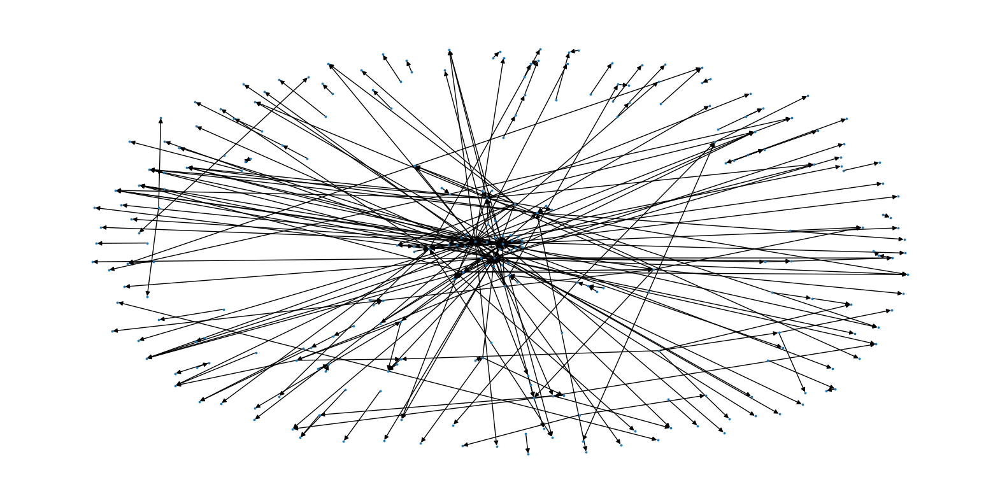

In [26]:
###  https://networkx.org/documentation/stable/auto_examples/drawing/plot_four_grids.htmlfig, all_axes = plt.subplots(2, 2)
# https://www.statology.org/subplot-size-matplotlib/

fig = plt.subplots(figsize=(20,10))

pos = nx.spring_layout(G)

nx.draw(G, pos, node_size=3)

plt.show()

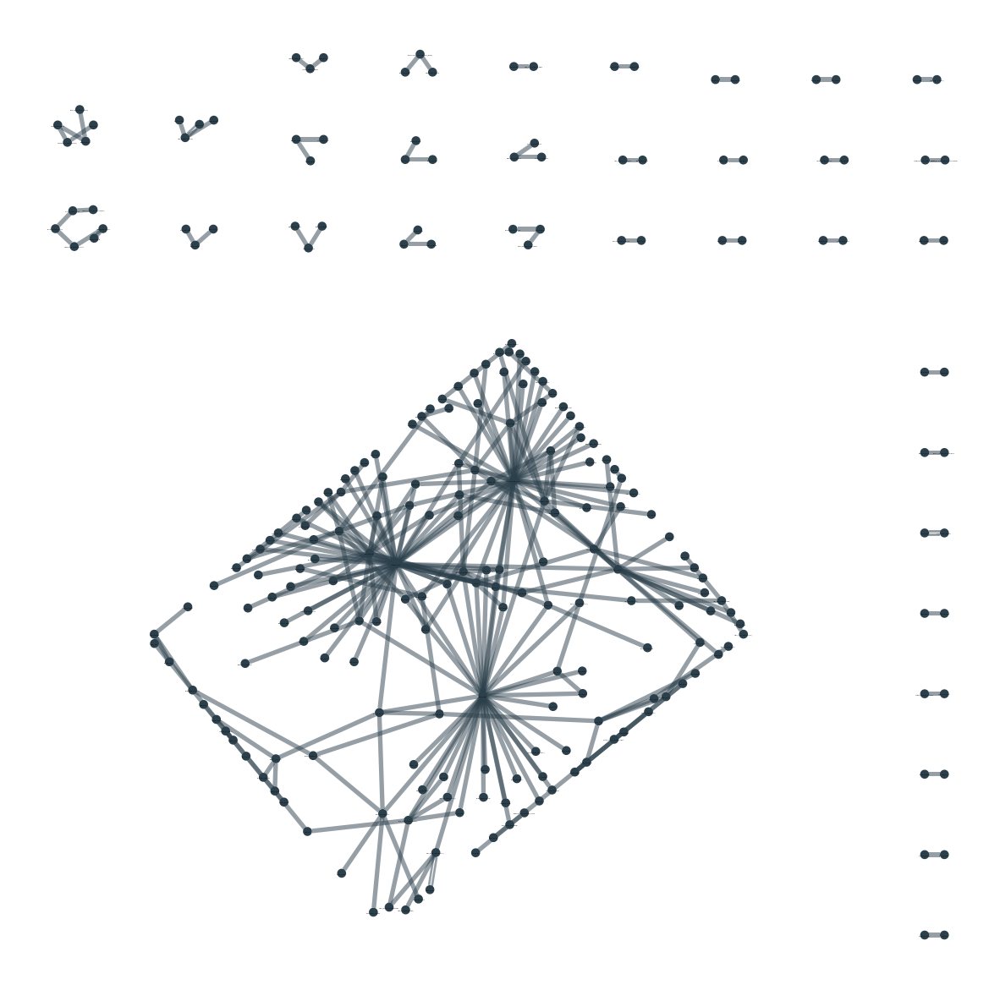

In [29]:
### Noter les composantes
# il y a des erreur numpy ! cachés avec la commande suivante
np.seterr(invalid='ignore')

fig = plt.figure(figsize=(15,15))
plot_instance = Graph(G,  node_color='red', node_size=0.5, node_labels=True, edge_width=0.5)


plt.show()

In [30]:
nl = [{i:i} for i in plot_instance.nodes]; type(nl), nl[:3]

(list,
 [{'Abraham_Gotthelf_Kästner': 'Abraham_Gotthelf_Kästner'},
  {'Johann_Christian_Martin_Bartels': 'Johann_Christian_Martin_Bartels'},
  {'Adrien-Marie_Legendre': 'Adrien-Marie_Legendre'}])

### Détecter les composantes du graphe

In [31]:
wcc = nx.weakly_connected_components(G)

In [32]:
lcc = [[list(c), len(c)] for c in wcc]; len(lcc), lcc[0]

(34,
 [['Johann_Friedrich_Pfaff',
   'Johann_Christian_Martin_Bartels',
   'Christian_August_Hausen',
   'Johann_Christoph_Wichmannshausen',
   'Abraham_Gotthelf_Kästner',
   'Johann_Elert_Bode'],
  6])

### Créer le sous-graphe en utilisant la composante plus grande

In [33]:
## La composante de dimension maximale
max_l = [i[0] for i in lcc if i[1] == max([i[1] for i in lcc])][0]; max_l[:3]

['Giovanni_Alfonso_Borelli', 'Sigmund_Freud', 'Nikolaus_Eglinger']

In [34]:
SG = G.subgraph(max_l)

In [35]:
SG.is_multigraph(), nx.is_strongly_connected(SG), SG.is_directed(), SG.number_of_nodes(), SG.number_of_edges(), nx.density(SG)

(False, False, True, 177, 239, 0.00767205957883924)

In [36]:
cb = nx.recursive_simple_cycles(SG) ; len(cb)

1

In [37]:
### https://networkx.org/nx-guides/content/algorithms/dag/index.html
try:
    print(nx.find_cycle(SG))
except Exception as e:
    print(e)

[('Henry_Briggs_(mathematician)', 'John_Napier'), ('John_Napier', 'Henry_Briggs_(mathematician)')]


#### Vérification manuelle

Vérifier quelle relation il faut supprimer

In [38]:
a = G.edges(['John_Napier', 'Henry_Briggs_(mathematician)']); a

OutEdgeDataView([('John_Napier', 'Henry_Briggs_(mathematician)'), ('Henry_Briggs_(mathematician)', 'Isaac_Newton'), ('Henry_Briggs_(mathematician)', 'James_Gregory_(mathematician)'), ('Henry_Briggs_(mathematician)', 'John_Napier'), ('Henry_Briggs_(mathematician)', 'John_Pell_(mathematician)')])

In [39]:
G.get_edge_data('John_Napier', 'Henry_Briggs_(mathematician)', default=None)

{'relationship': 'influenced'}

In [40]:
G.remove_edge('John_Napier', 'Henry_Briggs_(mathematician)')

In [41]:
### https://networkx.org/nx-guides/content/algorithms/dag/index.html
try:
    print(nx.find_cycle(SG))
except Exception as e:
    print(e)

No cycle found.


### Centralité de degré

Documentation: [degree_centrality(G)](https://networkx.org/documentation/stable/reference/algorithms/generated/networkx.algorithms.centrality.degree_centrality.html#networkx.algorithms.centrality.degree_centrality)

In [42]:
### Noter le résultat de la fonction
print([d for d in nx.degree(SG)][:3])
print('----')
### l'ajout d'une propriété doit se faire sous la forme de dictionnaire
# On construit ici le dictionnaire selon le format souhaité
degree = dict([(d[0], {'degree': d[1]}) for d in nx.degree(SG)])
#print(degree)

[('Adrien-Marie_Legendre', 1), ('Évariste_Galois', 2), ('Anne_Conway_(philosopher)', 1)]
----


In [43]:
nx.set_node_attributes(SG, degree)
print(list(SG.nodes.data())[:3])

[('Adrien-Marie_Legendre', {'degree': 1}), ('Évariste_Galois', {'degree': 2}), ('Anne_Conway_(philosopher)', {'degree': 1})]


In [44]:
sb = sorted(list(nx.degree(SG)), key=lambda x: x[1], reverse=True)
sb[:5]

[('René_Descartes', 41),
 ('Gottfried_Wilhelm_Leibniz', 37),
 ('Isaac_Newton', 36),
 ('Pierre_Gassendi', 16),
 ('Blaise_Pascal', 14)]

In [45]:
print(len(person), person.sort_values(by='effectif_out', ascending=False).head(7))

55                            person  effectif_out  effectif_in
17      Gottfried_Wilhelm_Leibniz            29            8
19                   Isaac_Newton            28            9
46                 René_Descartes            22           19
43                Pierre_Gassendi            11            5
2                   Blaise_Pascal             8            6
37                 Leonhard_Euler             5            3
6   David_Gregory_(mathematician)             4            2


In [46]:
## Proportions dans ce cas, non effectifs
sorted(nx.out_degree_centrality(SG).items(), key=lambda kv: kv[1], reverse=True)[:5]

[('Gottfried_Wilhelm_Leibniz', 0.16477272727272727),
 ('Isaac_Newton', 0.1534090909090909),
 ('René_Descartes', 0.125),
 ('Pierre_Gassendi', 0.0625),
 ('Blaise_Pascal', 0.045454545454545456)]

### Centralité d'influence ou de pouvoir (_eigenvector_)

[Eigenvector centrality](https://networkx.org/documentation/stable/reference/algorithms/generated/networkx.algorithms.centrality.eigenvector_centrality.html#networkx.algorithms.centrality.eigenvector_centrality)

"For directed graphs this is “left” eigenvector centrality which corresponds to the in-edges in the graph. For out-edges eigenvector centrality first reverse the graph with G.reverse()."

On inverse donc pour calculer le pouvoir à droite, c'est-à-dire dans les arcs sortants, et donc vers la déscendance


In [47]:
### https://networkx.org/documentation/stable/reference/algorithms/generated/networkx.algorithms.centrality.eigenvector_centrality_numpy.html
eigenvector = nx.eigenvector_centrality_numpy(SG.reverse())

In [48]:
l = sorted((v, f"{c:0.2f}") for v, c in eigenvector.items())
l[:3]

[('Abraham_Sharp', '-0.00'),
 ('Abraham_de_Moivre', '-0.00'),
 ('Adrien-Marie_Legendre', '0.00')]

In [49]:
nx.set_node_attributes(SG, eigenvector, 'eigenvector')
print(list(SG.nodes.data())[:3])

[('Adrien-Marie_Legendre', {'degree': 1, 'eigenvector': 2.1928007626693484e-16}), ('Évariste_Galois', {'degree': 2, 'eigenvector': 4.444092967190851e-19}), ('Anne_Conway_(philosopher)', {'degree': 1, 'eigenvector': 3.2274346352832955e-07})]


### Centralité d'intermédiarité

[Betweenness centrality](https://networkx.org/documentation/stable/reference/algorithms/generated/networkx.algorithms.centrality.betweenness_centrality.html#networkx.algorithms.centrality.betweenness_centrality)

In [50]:
#print(nx.betweenness_centrality(G))
betweenness = nx.betweenness_centrality(SG)

In [51]:
sb = sorted(betweenness.items(), key=lambda x: x[1])
sb[:5]

[('Adrien-Marie_Legendre', 0.0),
 ('Évariste_Galois', 0.0),
 ('Anne_Conway_(philosopher)', 0.0),
 ('Anselm_of_Canterbury', 0.0),
 ('Aristotle', 0.0)]

In [52]:
sb_df = pd.DataFrame(sb)
sb_df.columns = ['person','betweenness']
sb_df.sort_values(by='betweenness', ascending=False)

,person,betweenness
176,René_Descartes,0.050851
175,Isaac_Newton,0.029416
174,Gottfried_Wilhelm_Leibniz,0.028096
173,Blaise_Pascal,0.011988
172,Christiaan_Huygens,0.006867
...,...,...
61,Voltaire,0.000000
62,Walter_Rauschenbusch,0.000000
63,Wilhelm_Wundt,0.000000
64,Émilie_du_Châtelet,0.000000


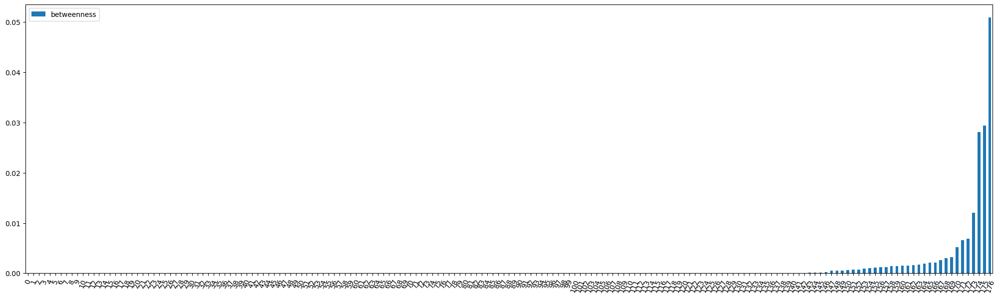

In [53]:
### Cette visualisation donne une impression de la dispersion
x = sb_df.plot.bar(y='betweenness', rot=70, figsize=(25,7))

<Axes: >

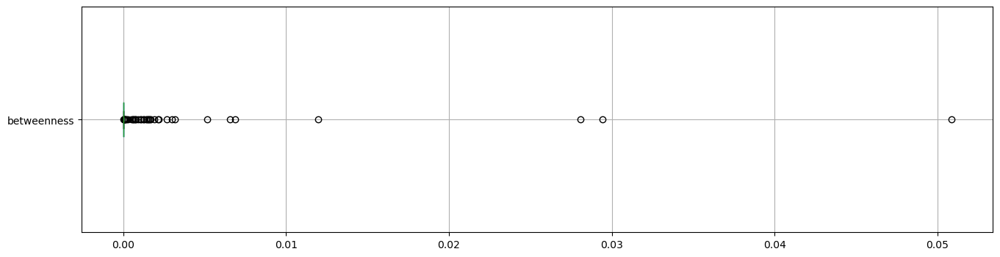

In [54]:
sb_df.boxplot(column=['betweenness'], vert=False, figsize=(16,4))

<Axes: >

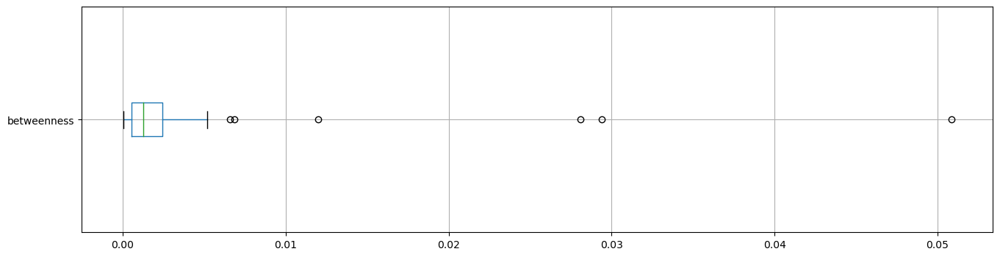

In [55]:
sb_df[sb_df['betweenness'] != 0].boxplot(column=['betweenness'], vert=False, figsize=(16,4))

In [56]:
nx.set_node_attributes(SG, betweenness, 'betweenness')
print(list(SG.nodes.data())[:3])

[('Adrien-Marie_Legendre', {'degree': 1, 'eigenvector': 2.1928007626693484e-16, 'betweenness': 0.0}), ('Évariste_Galois', {'degree': 2, 'eigenvector': 4.444092967190851e-19, 'betweenness': 0.0}), ('Anne_Conway_(philosopher)', {'degree': 1, 'eigenvector': 3.2274346352832955e-07, 'betweenness': 0.0})]


https://networkx.org/documentation/stable/auto_examples/graph/plot_dag_layout.html

In [57]:
### Calculer des 'générations', les premiers parents, puis leurs enfants, etc.
for layer, nodes in enumerate(nx.topological_generations(SG)):
    # `multipartite_layout` expects the layer as a node attribute, so add the
    # numeric layer value as a node attribute
    for node in nodes:
        SG.nodes[node]["layer"] = layer

In [58]:
list(SG.nodes.data())[:5]

[('Adrien-Marie_Legendre',
  {'degree': 1,
   'eigenvector': 2.1928007626693484e-16,
   'betweenness': 0.0,
   'layer': 0}),
 ('Évariste_Galois',
  {'degree': 2,
   'eigenvector': 4.444092967190851e-19,
   'betweenness': 0.0,
   'layer': 10}),
 ('Anne_Conway_(philosopher)',
  {'degree': 1,
   'eigenvector': 3.2274346352832955e-07,
   'betweenness': 0.0,
   'layer': 0}),
 ('Gottfried_Wilhelm_Leibniz',
  {'degree': 37,
   'eigenvector': 3.694410877673698e-09,
   'betweenness': 0.028095779220779216,
   'layer': 5}),
 ('Anselm_of_Canterbury',
  {'degree': 1,
   'eigenvector': 0.0025071390539761224,
   'betweenness': 0.0,
   'layer': 0})]

In [59]:
### Cf. Nooy, Wouter de, Andrej Mrvar, and Vladimir Batagelj,
# Exploratory Social Network Analysis with Pajek, Structural Analysis in the Social Sciences, 46, 
# Third edition (Cambridge: Cambridge University Press, 2018), chapter 11

nx.is_directed_acyclic_graph(SG)

True

In [60]:
### Adapter la taille des attribut à l'affichage
node_sizes = [np.sqrt(i[1]['betweenness'])*10000 + 10 for i in list(SG.nodes.data())]
node_sizes[:3]

[10.0, 10.0, 10.0]

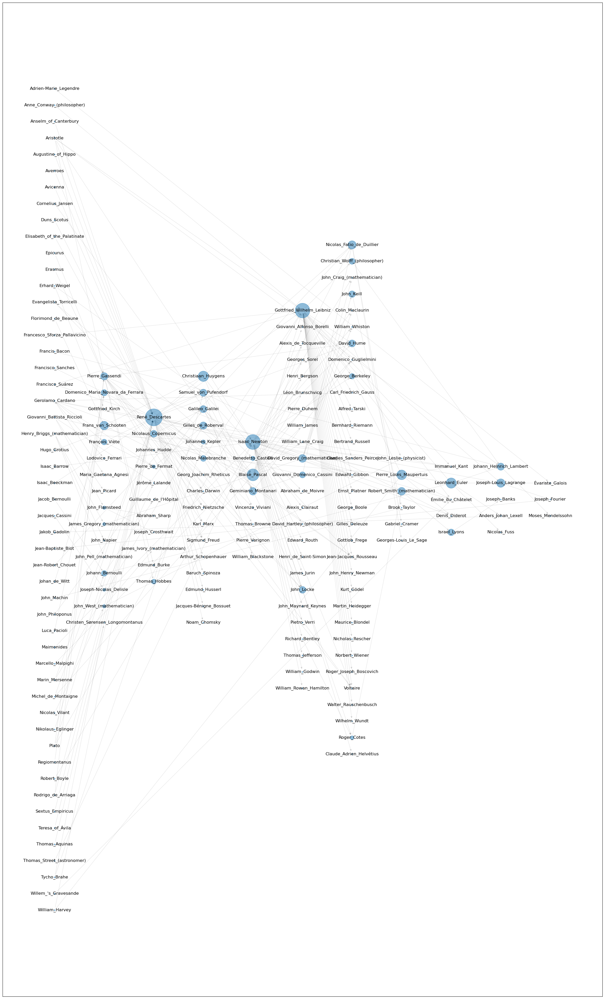

In [61]:
pos = nx.multipartite_layout(SG, subset_key="layer")

plt.figure(figsize = (30,50))


nx.draw_networkx_nodes(SG,pos=pos,node_size=node_sizes, alpha=0.5)#draw nodes
nx.draw_networkx_labels(SG, pos,font_size=12)
[nx.draw_networkx_edges(SG,pos=pos,alpha=0.1)] #loop through edges and draw them

plt.show()

### Générations

In [62]:
df.columns

Index(['subject_uri', 'subjectBirthDate', 'typeRelationship', 'object_uri',
       'objectBirthDate', 'source', 'relationship', 'target'],
      dtype='object')

In [63]:
### Récupérer l'URI et date de naissance des sujets-sources
df1 = df[['subject_uri', 'subjectBirthDate']].copy(deep=True)
df1.columns=['uri','birthDate']
df1['object'] = df1['uri'].apply(lambda x : x.replace('http://dbpedia.org/resource/', ''))
len(df1),df1.head()

(336,
                                                  uri   birthDate  \
 0  http://dbpedia.org/resource/Domenico_Maria_Nov...  1454-08-01   
 1  http://dbpedia.org/resource/Domenico_Maria_Nov...  1454-08-01   
 2    http://dbpedia.org/resource/Nicolaus_Copernicus  1473-02-19   
 3    http://dbpedia.org/resource/Nicolaus_Copernicus  1473-02-19   
 4    http://dbpedia.org/resource/Nicolaus_Copernicus  1473-02-19   
 
                              object  
 0  Domenico_Maria_Novara_da_Ferrara  
 1  Domenico_Maria_Novara_da_Ferrara  
 2               Nicolaus_Copernicus  
 3               Nicolaus_Copernicus  
 4               Nicolaus_Copernicus  )

In [64]:
### Récupérer l'URI et date de naissance des targets 
df2 = df[['object_uri', 'objectBirthDate']].copy(deep=True)
df2.columns=['uri','birthDate']
df2['object'] = df2['uri'].apply(lambda x : x.replace('http://dbpedia.org/resource/', ''))
len(df2), df2.head()

(336,
                                                  uri   birthDate  \
 0          http://dbpedia.org/resource/Regiomontanus  1436-06-06   
 1           http://dbpedia.org/resource/Luca_Pacioli        1447   
 2        http://dbpedia.org/resource/Johannes_Kepler  1571-12-27   
 3  http://dbpedia.org/resource/Domenico_Maria_Nov...  1454-08-01   
 4  http://dbpedia.org/resource/Domenico_Maria_Nov...  0001-07-29   
 
                              object  
 0                     Regiomontanus  
 1                      Luca_Pacioli  
 2                   Johannes_Kepler  
 3  Domenico_Maria_Novara_da_Ferrara  
 4  Domenico_Maria_Novara_da_Ferrara  )

In [65]:
## Concaténer les deux tableaux
cdf = pd.concat([df1,df2])
len(cdf)

672

### Inspection et nettoyage des valeurs

In [66]:
## supprimer les doublons afin d'avoir des valeurs uniques
cdf = cdf.drop_duplicates(); len(cdf)
cdf.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 269 entries, 0 to 333
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   uri        269 non-null    object
 1   birthDate  268 non-null    object
 2   object     269 non-null    object
dtypes: object(3)
memory usage: 8.4+ KB


In [67]:
## On observe qu'il y a des valeurs nulles, les chercher
cdf[cdf.isna().any(axis=1)]

,uri,birthDate,object
58,http://dbpedia.org/resource/David_Hume,NaN,David_Hume


In [68]:
## Y a-t- il d'autres lignes concernant Hume
cdf[cdf['object'].str.contains('Hume')]

,uri,birthDate,object
57,http://dbpedia.org/resource/David_Hume,0001-05-07,David_Hume
58,http://dbpedia.org/resource/David_Hume,NaN,David_Hume


In [69]:
## Supprimer la ligne à double
cdf = cdf.drop(index=58)

In [70]:
cdf['birthDate'][cdf.index==57] = '1711-05-07'

In [71]:
cdf.birthDate.sort_values(ascending=False).head(20)

37                c. 490
299              c. 1736
284              c. 1700
263              c. 1686
189              c. 1653
100           c. 1265/66
97               c. 1033
104    Second century AD
186         October 1630
32         November 1638
61       February 341 BC
178        February 1698
99                   980
64                   428
63                   384
130           1949-08-23
74            1928-12-07
205           1928-07-15
199           1925-01-18
212           1906-04-28
Name: birthDate, dtype: object

In [72]:
cdf[cdf.index==37]

,uri,birthDate,object
37,http://dbpedia.org/resource/John_Philoponus,c. 490,John_Philoponus


In [73]:
#### Corrections effectuéés
# Code 0002 = avant notre Ère
cdf['birthDate'][cdf.index==37] = '0490'
cdf['birthDate'][cdf.index==299] = '1736'
cdf['birthDate'][cdf.index==284] = '1700'
cdf['birthDate'][cdf.index==263] = '1686'
cdf['birthDate'][cdf.index==189] = '1653'
cdf['birthDate'][cdf.index==100] = '1265'
cdf['birthDate'][cdf.index==97] = '1033'
cdf['birthDate'][cdf.index==104] = '0002'
cdf['birthDate'][cdf.index==186] = '1630'
cdf['birthDate'][cdf.index==32] = '1638'
cdf['birthDate'][cdf.index==61] = '0002'
cdf['birthDate'][cdf.index==178] = '1698'
cdf['birthDate'][cdf.index==99] = '0980'
cdf['birthDate'][cdf.index==64] = '0428'
cdf['birthDate'][cdf.index==63] = '0384'

In [74]:
cdf.birthDate.sort_values(ascending=True).head(20)

183    0001-03-28
184    0001-03-30
175    0001-06-21
4      0001-07-29
62     0001-10-28
15     0001-10-31
179    0001-12-15
14     0001-12-25
61           0002
104          0002
88     0354-11-13
63           0384
64           0428
37           0490
99           0980
97           1033
89     1126-04-14
87     1225-01-28
100          1265
0      1436-06-06
Name: birthDate, dtype: object

In [75]:
cdf[cdf.birthDate.str.contains('0001')]

,uri,birthDate,object
4,http://dbpedia.org/resource/Domenico_Maria_Nov...,0001-07-29,Domenico_Maria_Novara_da_Ferrara
14,http://dbpedia.org/resource/Isaac_Newton,0001-12-25,Isaac_Newton
15,http://dbpedia.org/resource/Pierre_de_Fermat,0001-10-31,Pierre_de_Fermat
62,http://dbpedia.org/resource/Erasmus,0001-10-28,Erasmus
175,http://dbpedia.org/resource/David_Hartley_(phi...,0001-06-21,David_Hartley_(philosopher)
179,http://dbpedia.org/resource/James_Jurin,0001-12-15,James_Jurin
183,http://dbpedia.org/resource/Maimonides,0001-03-28,Maimonides
184,http://dbpedia.org/resource/Maimonides,0001-03-30,Maimonides


In [76]:
## Supprimer la ligne à double
cdf = cdf.drop(index=[4,14,15, 62, 175, 179, 184])

In [77]:
cdf[cdf.object.str.contains('Newton')]

,uri,birthDate,object
156,http://dbpedia.org/resource/Isaac_Newton,1642-12-25,Isaac_Newton


In [78]:
cdf['year'] = cdf['birthDate'].apply(lambda x : int(str(x)[:4]))
cdf.head(3)

,uri,birthDate,object,year
0,http://dbpedia.org/resource/Domenico_Maria_Nov...,1454-08-01,Domenico_Maria_Novara_da_Ferrara,1454
2,http://dbpedia.org/resource/Nicolaus_Copernicus,1473-02-19,Nicolaus_Copernicus,1473
5,http://dbpedia.org/resource/Nicolaus_Olahus,1493-01-10,Nicolaus_Olahus,1493


In [79]:
cdf.year.sort_values(ascending=True).head(20)

183       1
61        2
104       2
88      354
63      384
64      428
37      490
99      980
97     1033
89     1126
87     1225
100    1265
0      1436
1      1447
0      1454
60     1466
17     1469
2      1473
6      1482
5      1493
Name: year, dtype: int64

<Axes: >

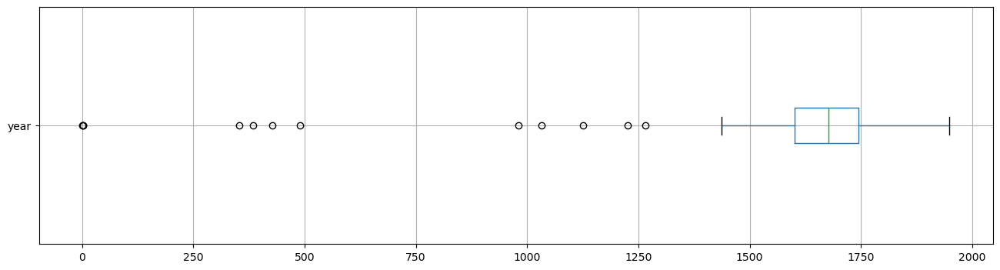

In [80]:
cdf.boxplot(column=['year'], vert=False, figsize=(16,4))

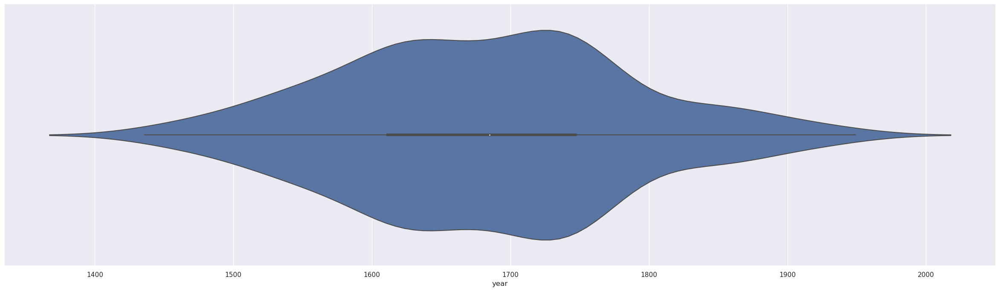

In [81]:
import seaborn as sns

sns.set_theme(style="whitegrid")

sns.set(rc={"figure.figsize":(30, 8)})

ax = sns.violinplot(x='year', 
                    data = cdf[cdf['year']>1300])


In [82]:
cdf.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 261 entries, 0 to 333
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   uri        261 non-null    object
 1   birthDate  261 non-null    object
 2   object     261 non-null    object
 3   year       261 non-null    int64 
dtypes: int64(1), object(3)
memory usage: 10.2+ KB


In [83]:
bins = [r for r in range(1421, 1821, 20)]
bins = [0] + bins + [2001]
bins

[0,
 1421,
 1441,
 1461,
 1481,
 1501,
 1521,
 1541,
 1561,
 1581,
 1601,
 1621,
 1641,
 1661,
 1681,
 1701,
 1721,
 1741,
 1761,
 1781,
 1801,
 2001]

In [84]:
cdf['cut_year'] = pd.cut(cdf['year'], bins=bins, right=False  )
cdf.head(2)

,uri,birthDate,object,year,cut_year
0,http://dbpedia.org/resource/Domenico_Maria_Nov...,1454-08-01,Domenico_Maria_Novara_da_Ferrara,1454,"[1441, 1461)"
2,http://dbpedia.org/resource/Nicolaus_Copernicus,1473-02-19,Nicolaus_Copernicus,1473,"[1461, 1481)"


In [85]:
ccc = pd.DataFrame(cdf.groupby(by='cut_year').size())
ccc = ccc.reset_index()
ccc['gen'] = ccc.index
ccc.columns=['cut_year', 'eff', 'gen']
ccc

,cut_year,eff,gen
0,"[0, 1421)",12,0
1,"[1421, 1441)",1,1
2,"[1441, 1461)",2,2
3,"[1461, 1481)",3,3
4,"[1481, 1501)",2,4
5,"[1501, 1521)",7,5
6,"[1521, 1541)",8,6
7,"[1541, 1561)",9,7
8,"[1561, 1581)",10,8
9,"[1581, 1601)",11,9


<Axes: xlabel='cut_year'>

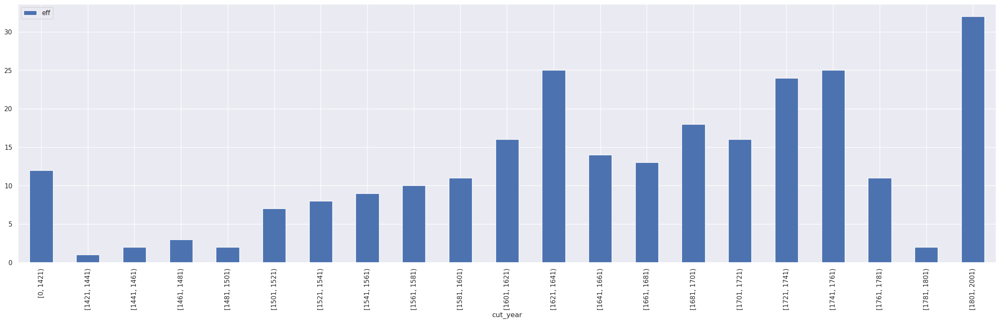

In [86]:
ccc.plot.bar(x = "cut_year", y = "eff")

In [87]:
ccc = ccc.drop('eff', axis=1)
type(ccc), ccc

(pandas.core.frame.DataFrame,
         cut_year  gen
 0      [0, 1421)    0
 1   [1421, 1441)    1
 2   [1441, 1461)    2
 3   [1461, 1481)    3
 4   [1481, 1501)    4
 5   [1501, 1521)    5
 6   [1521, 1541)    6
 7   [1541, 1561)    7
 8   [1561, 1581)    8
 9   [1581, 1601)    9
 10  [1601, 1621)   10
 11  [1621, 1641)   11
 12  [1641, 1661)   12
 13  [1661, 1681)   13
 14  [1681, 1701)   14
 15  [1701, 1721)   15
 16  [1721, 1741)   16
 17  [1741, 1761)   17
 18  [1761, 1781)   18
 19  [1781, 1801)   19
 20  [1801, 2001)   20)

In [88]:
mmm = pd.merge(cdf, ccc, left_on='cut_year', right_on='cut_year')
### https://github.com/mwouts/itables/blob/main/docs/advanced_parameters.md
show(mmm.sort_values(by='cut_year'), classes="display", scrollY="300px", scrollCollapse=True, paging=False, column_filters="footer", dom="lrtip")

In [89]:
### Vérifier que les classes sont bie nuniques
mmm.groupby(by='object').size().sort_values(ascending=False).head(10)

object
Abraham_Gotthelf_Kästner      1
Jérôme_Lalande                1
Karl_Marx                     1
Kurt_Gödel                    1
Laurentius_Paulinus_Gothus    1
Lazare_Carnot                 1
Leonhard_Euler                1
Lodovico_Ferrari              1
Louis-Alexandre_Berthier      1
Luca_Pacioli                  1
dtype: int64

## Plot par génération

In [90]:
mmm_d = dict([(g[0],  g[1]) for g in mmm[['object', 'gen']].values])
mmm_d

{'Domenico_Maria_Novara_da_Ferrara': 2,
 'Luca_Pacioli': 2,
 'Nicolaus_Copernicus': 3,
 'Manuel_I_of_Portugal': 3,
 'Erasmus': 3,
 'Nicolaus_Olahus': 4,
 'George_Martinuzzi': 4,
 'Gerolamo_Cardano': 5,
 'John_III_of_Portugal': 5,
 'Georg_Joachim_Rheticus': 5,
 'Antun_Vrančić': 5,
 'Gerardus_Mercator': 5,
 'Pedro_Nunes': 5,
 'Teresa_of_Ávila': 5,
 'Lodovico_Ferrari': 6,
 'John_Dee': 6,
 'Christopher_Clavius': 6,
 'François_Viète': 6,
 'Theodor_Zwinger': 6,
 'Thomas_Erastus': 6,
 'Ludolph_van_Ceulen': 6,
 'Michel_de_Montaigne': 6,
 'John_Napier': 7,
 'Petrus_Ryff': 7,
 'Sebastian_of_Portugal': 7,
 'Tycho_Brahe': 7,
 'Petrus_Kenicius': 7,
 'Rudolph_Snellius': 7,
 'Jost_Bürgi': 7,
 'Francisco_Suárez': 7,
 'Francisco_Sanches': 7,
 'Henry_Briggs_(mathematician)': 8,
 'Christen_Sørensen_Longomontanus': 8,
 'Galileo_Galilei': 8,
 'Laurentius_Paulinus_Gothus': 8,
 'Johannes_Kepler': 8,
 'Benedetto_Castelli': 8,
 'Willebrord_Snellius': 8,
 'Johannes_Canuti_Lenaeus': 8,
 'William_Harvey': 8,
 'Fr

In [91]:
nx.set_node_attributes(SG, mmm_d, 'gen')
print(list(SG.nodes.data())[:3])

[('Adrien-Marie_Legendre', {'degree': 1, 'eigenvector': 2.1928007626693484e-16, 'betweenness': 0.0, 'layer': 0, 'gen': 17}), ('Évariste_Galois', {'degree': 2, 'eigenvector': 4.444092967190851e-19, 'betweenness': 0.0, 'layer': 10, 'gen': 20}), ('Anne_Conway_(philosopher)', {'degree': 1, 'eigenvector': 3.2274346352832955e-07, 'betweenness': 0.0, 'layer': 0, 'gen': 11})]


In [92]:
### Vérifier que toutes les valeurs sont renseignées
print([(i[0],i[1].get('gen')) for i in SG.nodes.data() if i[1].get('gen') == None])

[]


In [93]:
### Adapter la taille des attribut à l'affichage
node_sizes = [np.sqrt(i[1]['betweenness'])*20000 + 10 for i in list(SG.nodes.data())]
node_sizes[:3]

[10.0, 10.0, 10.0]

In [94]:
### Adapter la taille des attribut à l'affichage
node_sizes = [np.sqrt(i[1]['eigenvector'])*20000 + 10 for i in list(SG.nodes.data())]
node_sizes[:3]

[10.00029616216927, 10.000013332806107, 21.362103036468724]

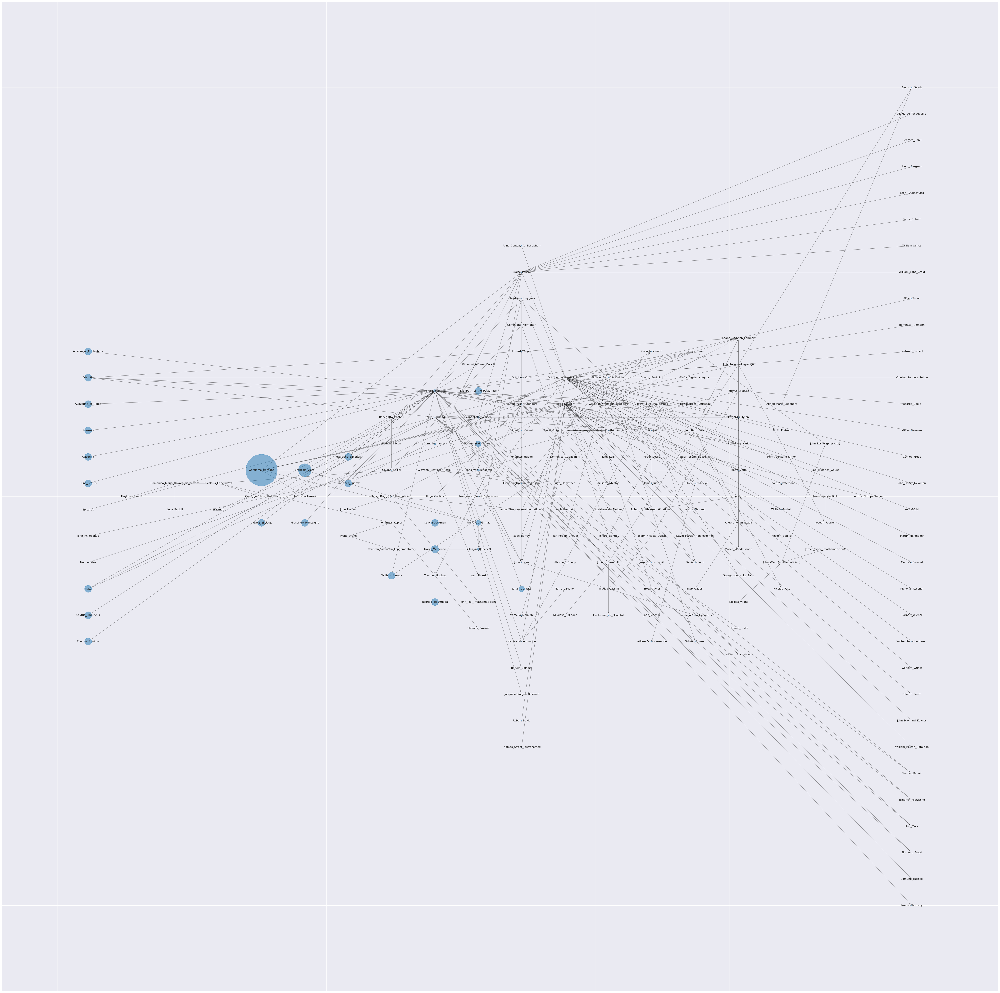

In [95]:
pos = nx.multipartite_layout(SG, subset_key="gen")

plt.figure(figsize = (80,80))


nx.draw_networkx_nodes(SG,pos=pos,node_size=node_sizes, alpha=0.5)#draw nodes
nx.draw_networkx_labels(SG,pos=pos, font_size=12)
[nx.draw_networkx_edges(SG,pos=pos,alpha=0.5)] #loop through edges and draw them

f = 'pictures/filiations.svg'# io.BytesIO()

plt.savefig(f, format="svg")

plt.show()

## Créer un ego-graphe

Dans l'ego-graphe on choisit un sommet et on calcule toutes ses relations, ascendantes et déscendantes

In [100]:
def draw_ego_graph(graph, person, radius=2, center=True, undirected=False, distance=None, centrality = 'betweenness', centrality_factor= 10000):
    
    
    EG = nx.ego_graph(graph, person, radius=radius, center=center, undirected=undirected, distance=distance)

    ### Adapter la taille des attribut à l'affichage
    node_sizes = [np.sqrt(i[1][centrality]) * centrality_factor + 10 for i in list(EG.nodes.data())]


    pos = nx.multipartite_layout(SG, subset_key="gen")

    plt.figure(figsize = (30,15))
    
    nodes_cols = ['red' if i == person else 'blue' for i in EG.nodes]


    nx.draw_networkx_nodes(EG,pos=pos,node_size=node_sizes, node_color=nodes_cols, alpha=0.6)
    nx.draw_networkx_labels(EG,pos=pos, font_size=12)
    [nx.draw_networkx_edges(EG,pos=pos,alpha=0.5)] #loop through edges and draw them

    f = f'pictures/ego_graph_{person}_r{str(radius)}.svg'# io.BytesIO()

    plt.savefig(f, format="svg")

    plt.show()

In [101]:
## Exemples : Johannes_Kepler Galileo_Galilei Geminiano_Montanari Leonhard_Euler

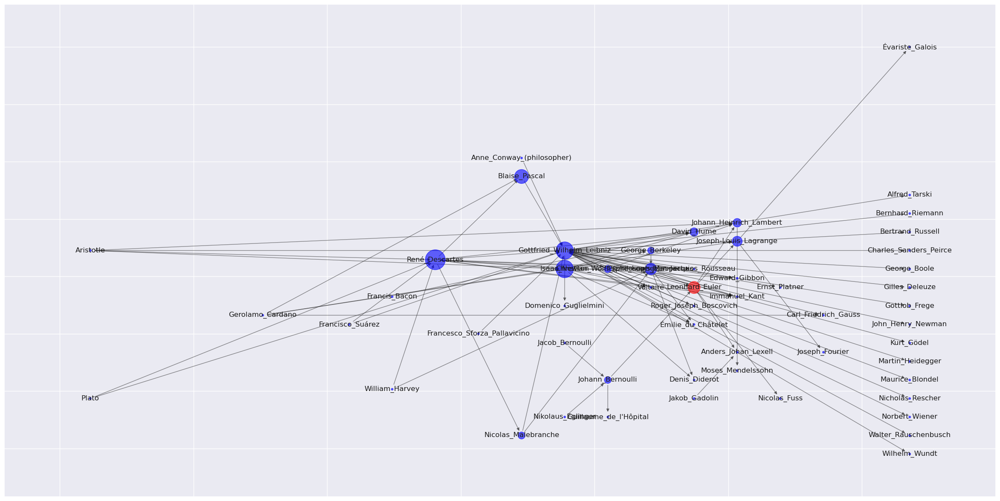

In [102]:
### Adapter les types de centralité ou le rayon des personnes considérées
draw_ego_graph(SG, 'Leonhard_Euler', radius=2, center=True, undirected=True, distance=None, centrality = 'betweenness', centrality_factor= 5000 )